This notebook presents an in-depth analysis of the data from Frangieh et al.'s groundbreaking study "Multimodal pooled Perturb-CITE-seq screens in patient models define mechanisms of cancer immune evasion" published in Nature Genetics. This study extends their findings, focusing on novel therapeutic approaches and molecular mechanisms in melanoma.

We will explore four key highlights from our analysis:
1. A combined therapeutic approach targeting COL1A1 and EIF4A for melanoma treatment.
2. A multi-targeted strategy for aggressive melanoma, combining PRAME-targeted immunotherapy with PARP inhibitors and EMT/stemness pathway inhibitors.
3. The complex interplay between CD274 (PD-L1), CD58, and CD9 in different immune microenvironments.
4. The potential role of LY96 in immune evasion across multiple cancer types, including melanoma.
We extend our gratitude to Frangieh, Melms, Thakore, Geiger-Schuller, and all other authors of the original study for their rigorous work and for making their data available, enabling our further exploration and analysis.


-----------------------------------


1) In this study of melanoma therapeutic targets, we identified a combined therapeutic approach targeting COL1A1 and EIF4A shows promise for melanoma treatment. This strategy appears more effective than targeting COL1A1 and AHCY, as EIF4A inhibition specifically impacts protein synthesis in rapidly dividing cancer cells, while AHCY inhibition affects broader cellular processes[1]. The presence of COL1A1 in IFNγ and co-culture conditions, along with its high correlation to EMT and stemness genes, further supports its role in cancer progression and metastasis[2,3]. Together, these findings suggest that dual inhibition of COL1A1 and EIF4A may provide a potent approach for controlling melanoma growth and metastatic behavior.

[1] The volcano plot indicates that perturbation of EIF4A and AHCY has significant effects on cancer cell viability.

[2] Figures 2 and 3 demonstrate COL1A1's correlation with EMT and stemness markers in IFNγ and co-culture conditions.

[3] Ma HP et al. Collagen 1A1 (COL1A1) Is a Reliable Biomarker and Putative Therapeutic Target for Hepatocellular Carcinogenesis and Metastasis. Cancers. 2019;11(6):786.

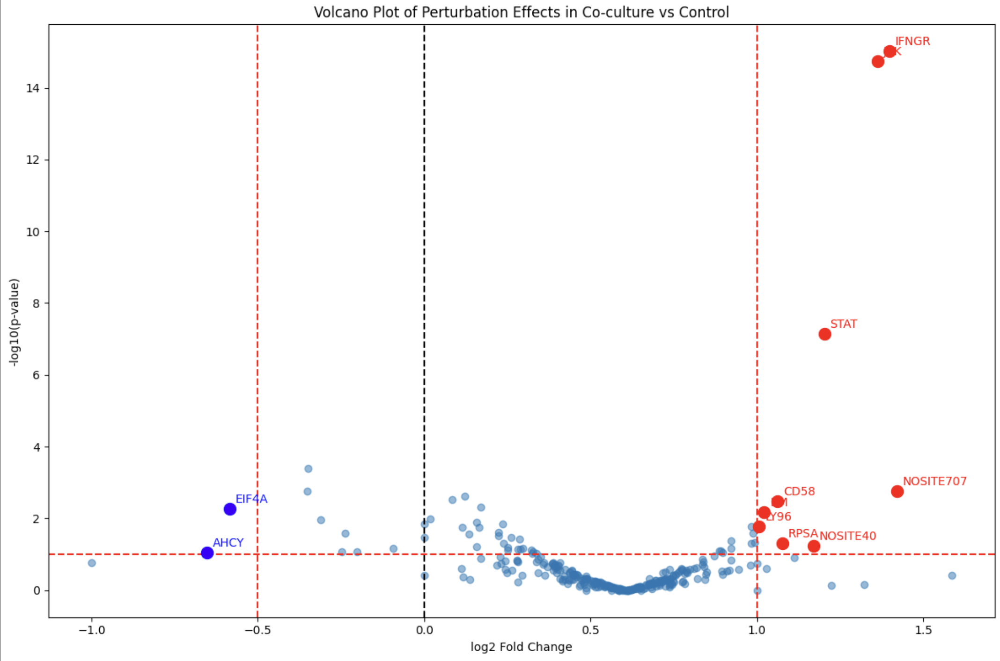


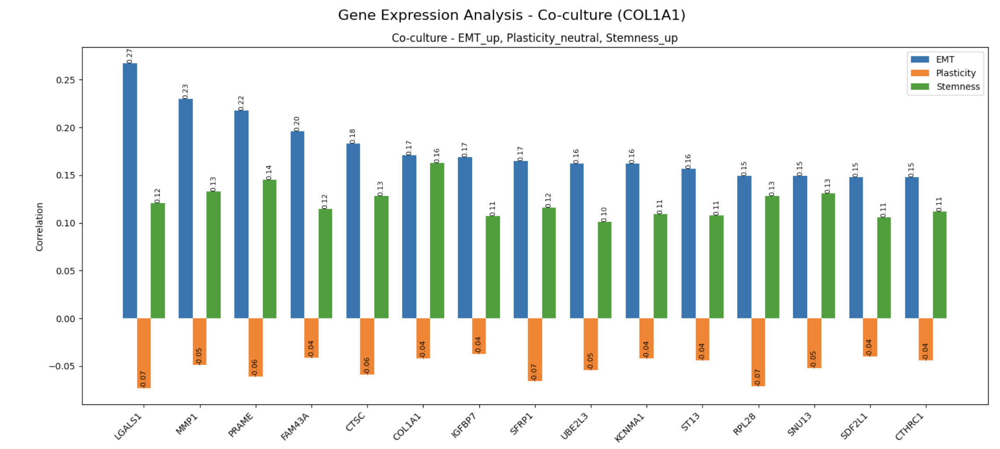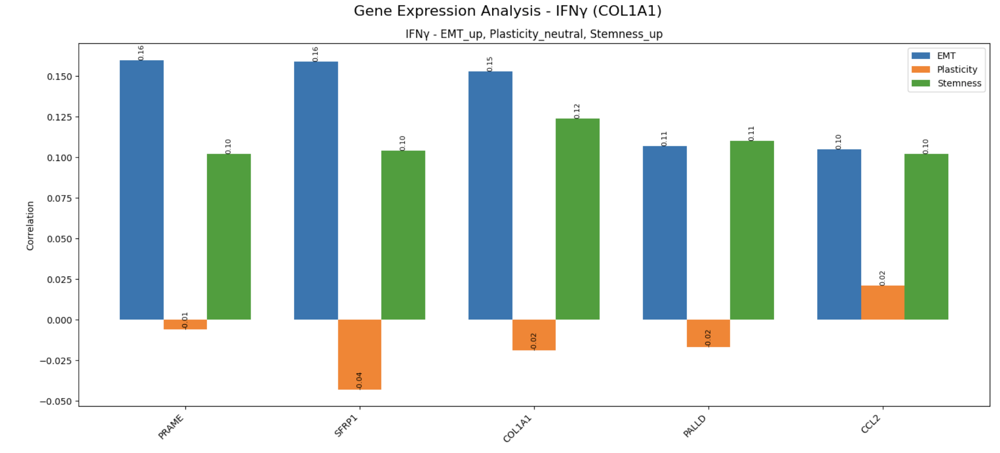
------------------------------------------------------------------------------



2) Based on the EMT and stemness score of this study, we propose a novel multi-targeted approach for aggressive melanoma treatment. This strategy combines PRAME-targeted immunotherapy[3] with PARP inhibitors to exploit PRAME-induced genomic instability[2], while also incorporating inhibitors of EMT and cancer stem cell pathways to address the increased EMT and stemness associated with PRAME expression[1]. This comprehensive approach simultaneously targets multiple oncogenic processes, potentially offering a more effective treatment for PRAME-positive melanomas.

[1]
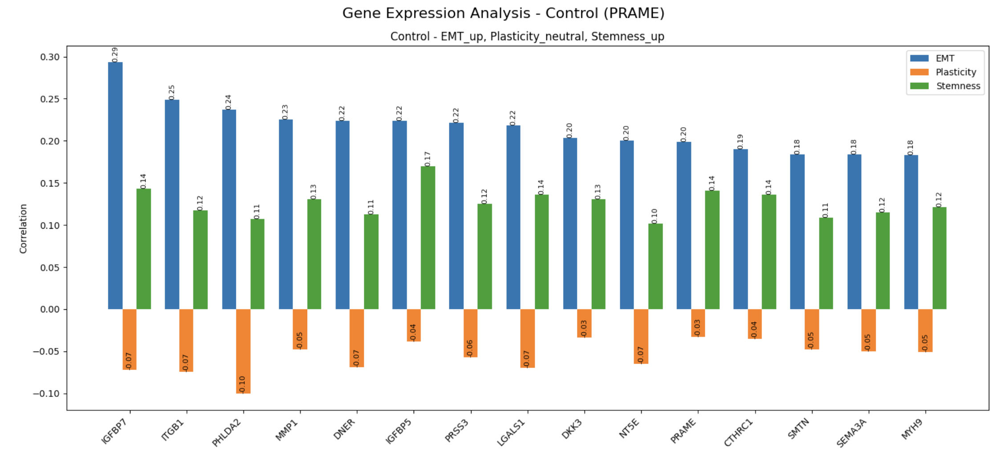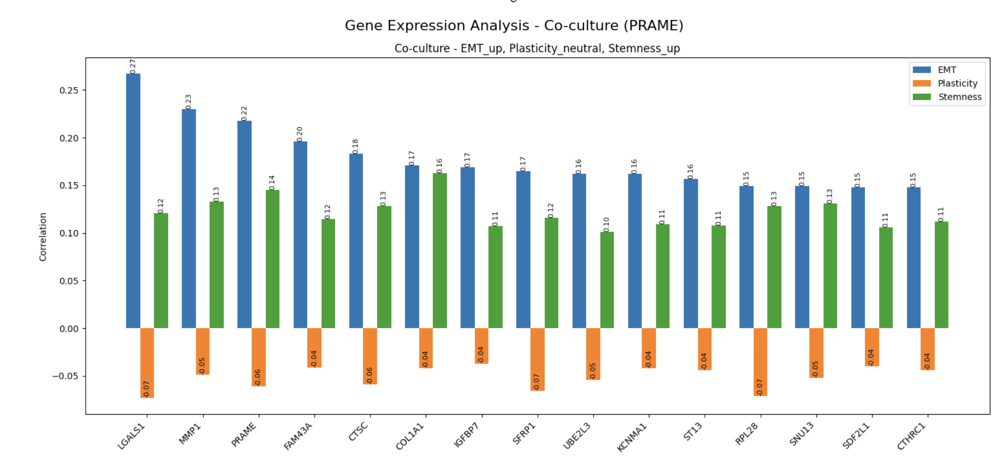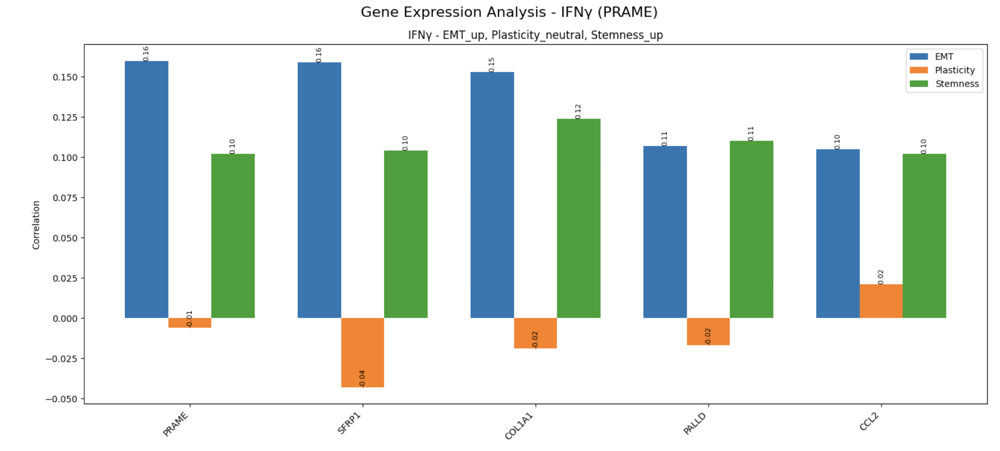
[2] Kurtenbach S, Sanchez MI, Kuznetsoff J, et al. PRAME induces genomic instability in uveal melanoma. Oncogene. 2024;43:555–565.

[3] Gezgin G, Luk SJ, Cao J, et al. PRAME as a Potential Target for Immunotherapy in Metastatic Uveal Melanoma. JAMA Ophthalmol. 2017;135:541-549.



------------------------------------------------------------------------------




3) CD274 (PD-L1), CD58, and CD9 exhibit complex and sometimes opposing behaviors, post-transcriptionally [1,2], in different immune microenvironments. In co-culture conditions, CD58's and CD9's RNA-protein correlation strengthens while CD274's weakens. Conversely, under IFNγ stimulation, CD274's correlation strengthens while CD58's and CD9's weaken. This relationship likely reflects a delicate balance between immune activation (CD58), suppression (CD274), and cell adhesion/invasion (CD9) that adapts to specific environmental cues. CD9, like CD58, plays a role in cell adhesion and motility, crucial for processes such as transendothelial migration in melanoma metastasis[3]. It also influences exosome secretion and uptake, potentially affecting cell-cell communication in the tumor microenvironment[4]. The contrasting responses of these proteins suggest that they are regulated by distinct cellular pathways, with CD9 specifically activating p38 MAPK and JNK pathways in melanoma cells[5].

[1,2]
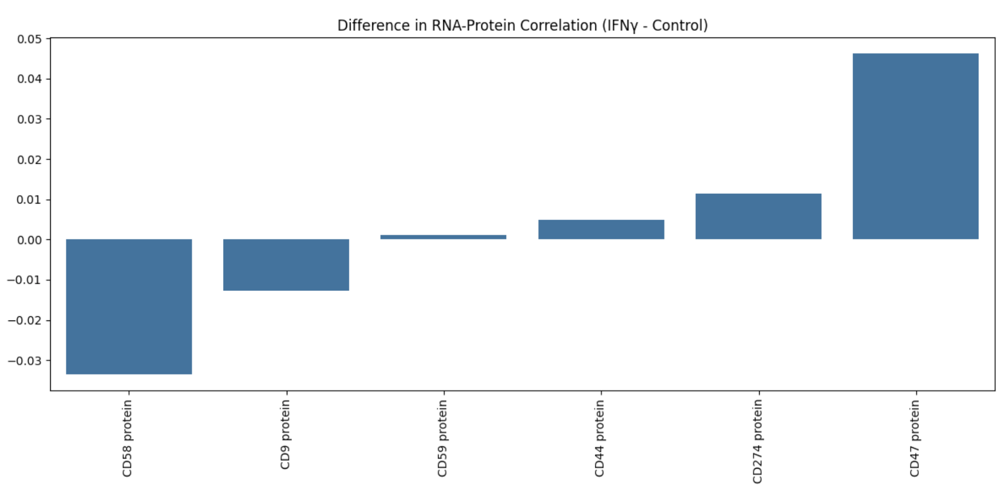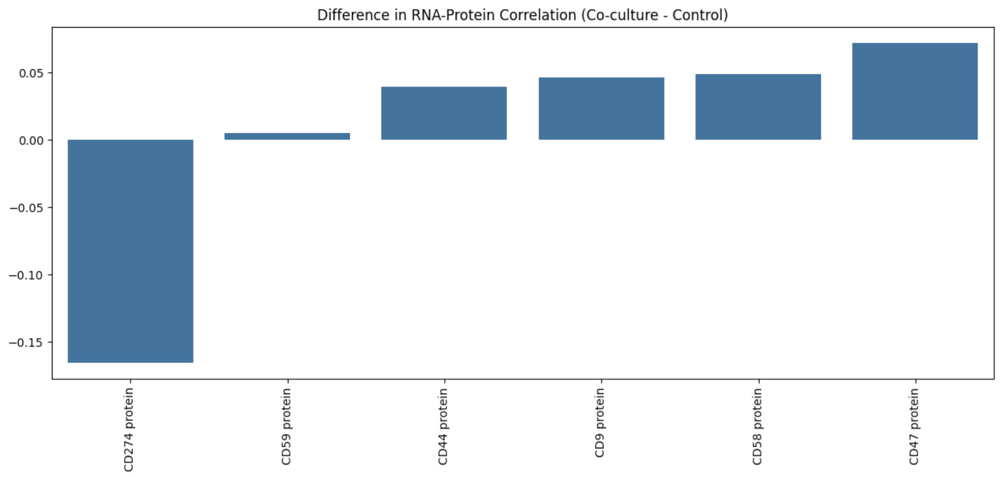
[3] Longo, N., et al. (2001). Blood, 98(13), 3717-3726.

[4] Suwatthanarak, T., et al. (2023). Biomaterials Advances, 146, 213283.

[5] Hong, I. K., et al. (2005). Experimental & Molecular Medicine, 37(3), 230-239.



------------------------------------------------------------------------------




4) This study identifies LY96 as a potential contributor to immune evasion in melanoma (Volcano figure), extending its known oncogenic roles beyond the prostate [1], renal [2], and colon cancers [3]. This finding suggests LY96 may have a broader impact across multiple cancer types, highlighting its potential as a therapeutic target for enhancing immunotherapy responses and inhibiting metastasis.

[1] Ferrari et al. (2024). Oncogene, 43:484-494.

[2] Li et al. (2023). MedComm – Oncology, 2:e52.

[3] Nie et al. (2022). Frontiers in Molecular Biosciences, 9:837393.


In [ ]:
!pip install pandas scanpy gseapy scvi-tools numpy dask dask-ml fastcluster scvelo python-igraph leidenalg imbalanced-learn  adjustText


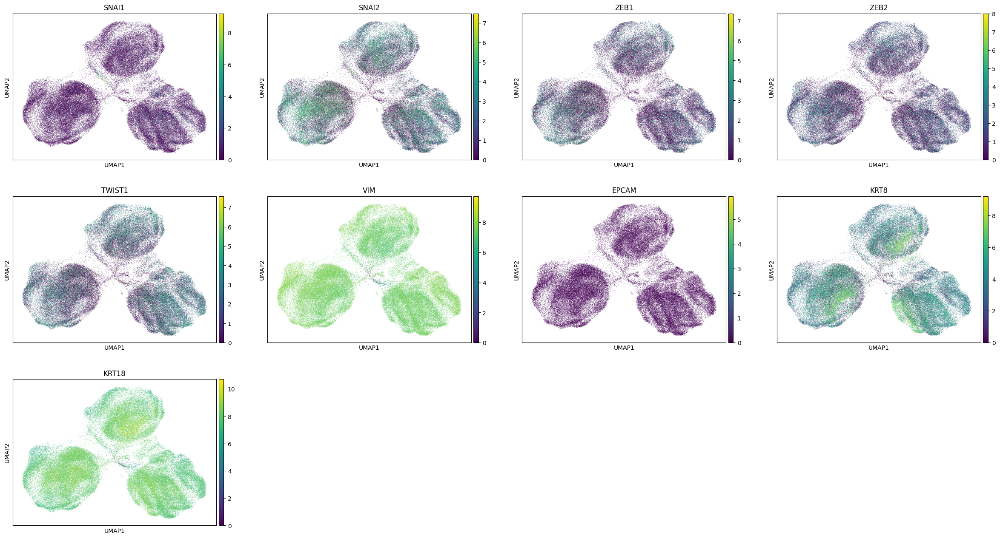

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scvelo as scv

adata = sc.read_h5ad('Frangieh_2021.h5ad')

# 1. EMT Score Analysis
def calculate_emt_score(adata, epithelial_genes, mesenchymal_genes):
    e_score = adata[:, adata.var_names.isin(epithelial_genes)].X.mean(axis=1)
    m_score = adata[:, adata.var_names.isin(mesenchymal_genes)].X.mean(axis=1)
    emt_score = m_score - e_score
    adata.obs['emt_score'] = emt_score

# Define epithelial and mesenchymal gene sets
epithelial_genes = ['CDH1', 'EPCAM', 'KRT8', 'KRT18']  # Add more genes as needed
mesenchymal_genes = ['VIM', 'CDH2', 'SNAI1', 'SNAI2']  # Add more genes as needed

calculate_emt_score(adata, epithelial_genes, mesenchymal_genes)

# 2. Plasticity Marker Analysis
plasticity_markers = ['SNAI1', 'SNAI2', 'ZEB1', 'ZEB2', 'TWIST1', 'VIM','EPCAM', 'KRT8', 'KRT18']
available_markers = [marker for marker in plasticity_markers if marker in adata.var_names]
sc.pl.umap(adata, color=available_markers, ncols=4, save='plasticity_markers.pdf')



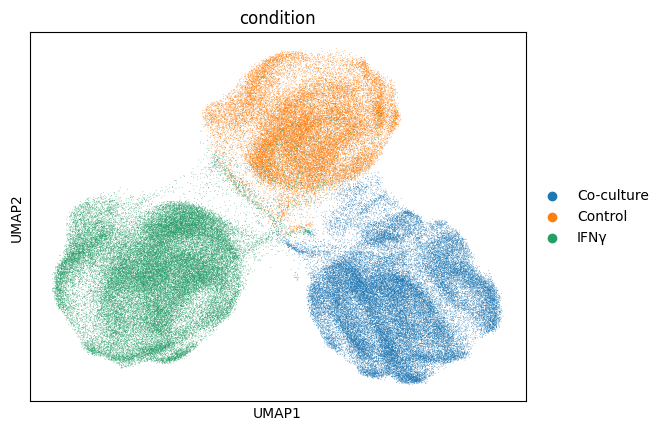

In [ ]:
sc.pl.umap(adata, color=['condition'])

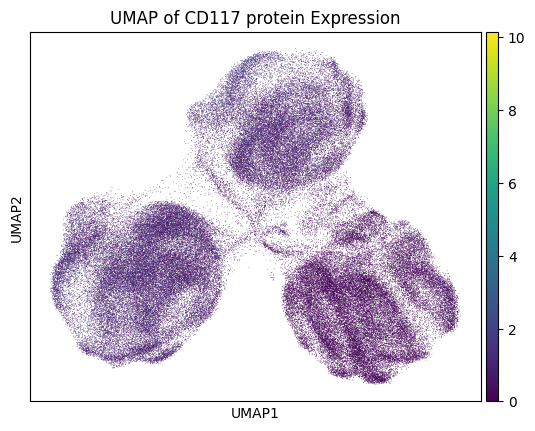

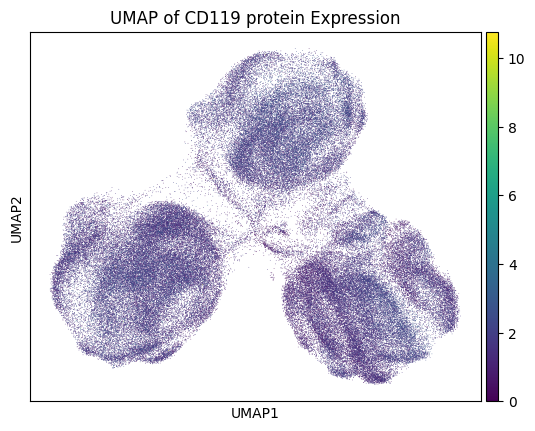

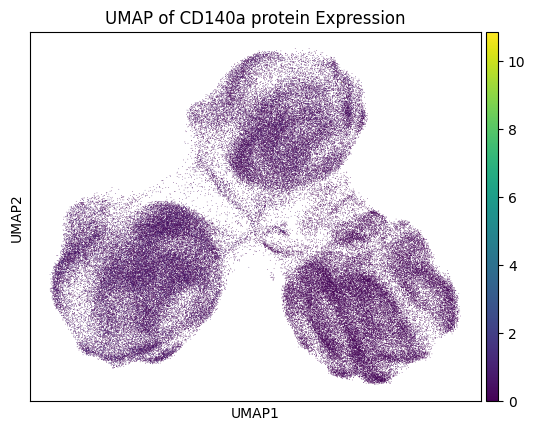

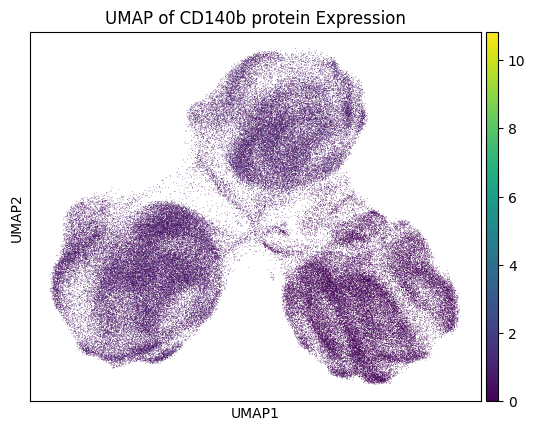

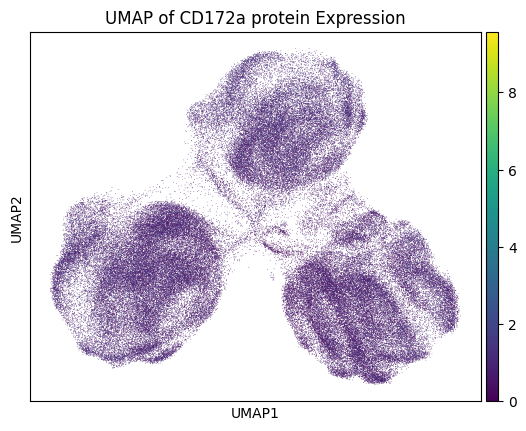

...

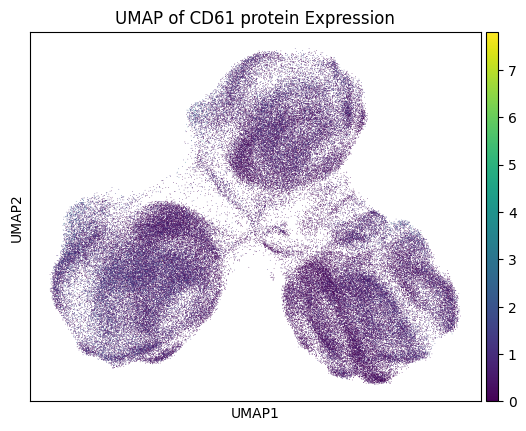

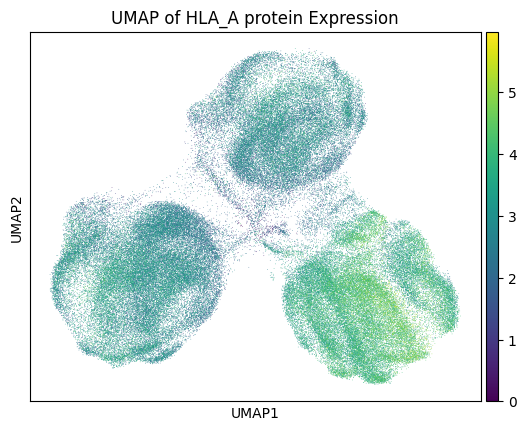

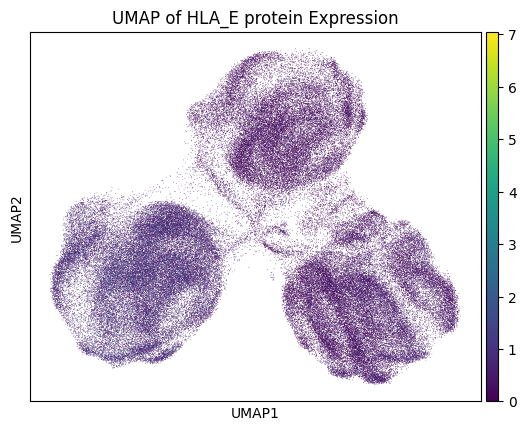

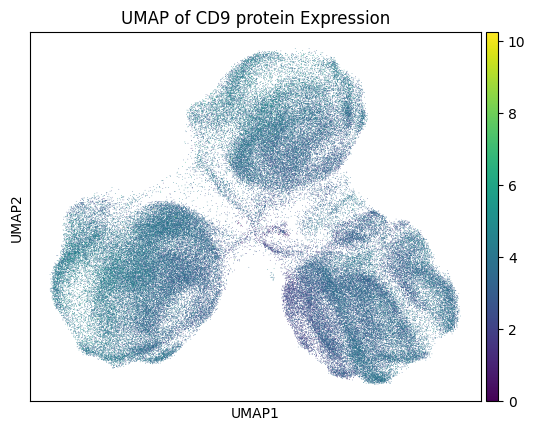

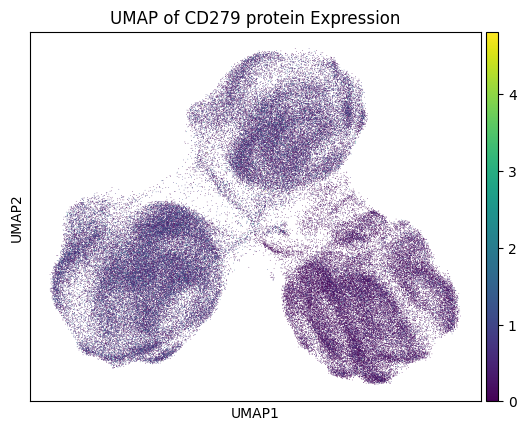

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import sparse

# Extract protein expression data and protein names
protein_data = adata.obsm['protein_expression']
protein_data = protein_data.astype(float)

protein_names = adata.uns['protein_names']

# Ensure protein_data is a dense array if it is sparse
if sparse.issparse(protein_data):
    protein_data = protein_data.toarray()

# Create a DataFrame for easier manipulation
protein_df = pd.DataFrame(protein_data, columns=protein_names)

# Iterate over each protein and create UMAP plots
for protein in protein_names:
    # Create a new AnnData object for each protein to plot
    adata_protein = adata.copy()
    adata_protein.obs[protein] = protein_df[protein].values

    # Plot UMAP with protein expression
    sc.pl.umap(adata_protein, color=[protein], title=f'UMAP of {protein} Expression')
    plt.show()


In [ ]:
import numpy as np
import scipy.sparse as sp
from sklearn.preprocessing import StandardScaler
import pandas as pd
import scanpy as sc
from scipy import stats

def calculate_scores(condition_data, epithelial_genes, mesenchymal_genes):
    e_expr = condition_data[:, condition_data.var_names.isin(epithelial_genes)].X
    m_expr = condition_data[:, condition_data.var_names.isin(mesenchymal_genes)].X

    if sp.issparse(e_expr):
        e_expr = e_expr.A
        m_expr = m_expr.A

    scaler = StandardScaler()
    e_expr_norm = scaler.fit_transform(e_expr)
    m_expr_norm = scaler.fit_transform(m_expr)

    emt_score = np.mean(m_expr_norm, axis=1) - np.mean(e_expr_norm, axis=1)
    plasticity_index = (np.std(e_expr_norm, axis=1) + np.std(m_expr_norm, axis=1)) / 2

    return emt_score, plasticity_index

def calculate_stemness_score(data, stemness_genes):
    stemness_expr = data[:, data.var_names.isin(stemness_genes)].X

    if sp.issparse(stemness_expr):
        stemness_expr = stemness_expr.A

    stemness_score = np.mean(stemness_expr, axis=1)
    return stemness_score

adata = sc.read_h5ad('Frangieh_2021.h5ad')

epithelial_genes = ['EPCAM', 'KRT8', 'KRT18', 'KRT5', 'KRT7', 'OCLN', 'CLDN1']
mesenchymal_genes = ['VIM', 'CDH2', 'SNAI1', 'SNAI2', 'FN1', 'TWIST1', 'ZEB1', 'ZEB2']
stemness_genes = ['ABCB5', 'NGFR', 'ALDH1A3', 'TRIM28','BRAF','NES','SOX2']

conditions = adata.obs['condition'].unique()

top_genes_by_condition = {}

for condition in conditions:
    print(f"\nAnalyzing condition: {condition}")
    condition_data = adata[adata.obs['condition'] == condition]

    emt_score, plasticity_index = calculate_scores(condition_data, epithelial_genes, mesenchymal_genes)
    stemness_score = calculate_stemness_score(condition_data, stemness_genes)

    print(f"EMT score, plasticity index, and stemness score calculated for condition: {condition}")

    correlations = []

    for gene in condition_data.var_names:
        gene_expr = condition_data[:, gene].X
        if sp.issparse(gene_expr):
            gene_expr = gene_expr.toarray().flatten()
        else:
            gene_expr = gene_expr.flatten()

        if np.all(gene_expr == gene_expr[0]):
            correlations.append((gene, np.nan, np.nan, np.nan))
            continue

        emt_corr, _ = stats.spearmanr(gene_expr, emt_score)
        plast_corr, _ = stats.spearmanr(gene_expr, plasticity_index)
        stemness_corr, _ = stats.spearmanr(gene_expr, stemness_score)
        correlations.append((gene, emt_corr, plast_corr, stemness_corr))

    df = pd.DataFrame(correlations, columns=['gene', 'emt_corr', 'plast_corr', 'stemness_corr'])
    df['emt_category'] = np.where(df['emt_corr'] < -0.1, 'down', np.where(df['emt_corr'] > 0.1, 'up', 'neutral'))
    df['plast_category'] = np.where(df['plast_corr'] < -0.1, 'down', np.where(df['plast_corr'] > 0.1, 'up', 'neutral'))
    df['stemness_category'] = np.where(df['stemness_corr'] < -0.1, 'down', np.where(df['stemness_corr'] > 0.1, 'up', 'neutral'))
    df['category'] = df['emt_category'] + '_' + df['plast_category'] + '_' + df['stemness_category']

    top_genes_by_condition[condition] = {}

    for category in ['up_up_up', 'up_up_down', 'up_down_up', 'up_down_down',
                     'down_up_up', 'down_up_down', 'down_down_up', 'down_down_down',
                     'neutral_up_up', 'neutral_up_down', 'neutral_down_up', 'neutral_down_down',
                     'up_neutral_up', 'up_neutral_down', 'down_neutral_up', 'down_neutral_down',
                     'neutral_neutral_up', 'neutral_neutral_down']:
        category_genes = df[df['category'] == category]
        top_genes_by_condition[condition][category] = category_genes.sort_values(
            'emt_corr' if 'up' in category.split('_')[0] else 'plast_corr', ascending='down' in category.split('_')
        ).head(15)

    for category, genes in top_genes_by_condition[condition].items():
        print(f"\nTop 15 genes for {category} in {condition} (EMT_{category.split('_')[0]}, Plasticity_{category.split('_')[1]}, Stemness_{category.split('_')[2]}):")
        for _, row in genes.iterrows():
            print(f"{row['gene']}: EMT corr = {row['emt_corr']:.3f}, Plasticity corr = {row['plast_corr']:.3f}, Stemness corr = {row['stemness_corr']:.3f}")

# The top_genes_by_condition variable now holds the top genes for each condition and category.



Analyzing condition: Control
EMT score, plasticity index, and stemness score calculated for condition: Control

Top 15 genes for up_up_up in Control (EMT_up, Plasticity_up, Stemness_up):

Top 15 genes for up_up_down in Control (EMT_up, Plasticity_up, Stemness_down):

Top 15 genes for up_down_up in Control (EMT_up, Plasticity_down, Stemness_up):
UBE2S: EMT corr = 0.120, Plasticity corr = -0.117, Stemness corr = 0.139
RPS5: EMT corr = 0.131, Plasticity corr = -0.125, Stemness corr = 0.135
RPS9: EMT corr = 0.154, Plasticity corr = -0.145, Stemness corr = 0.136
C12orf75: EMT corr = 0.193, Plasticity corr = -0.136, Stemness corr = 0.130
RPL28: EMT corr = 0.199, Plasticity corr = -0.102, Stemness corr = 0.144
HMGA1: EMT corr = 0.202, Plasticity corr = -0.116, Stemness corr = 0.117
ARL4C: EMT corr = 0.216, Plasticity corr = -0.100, Stemness corr = 0.119
DCBLD2: EMT corr = 0.241, Plasticity corr = -0.100, Stemness corr = 0.103
MT2A: EMT corr = 0.248, Plasticity corr = -0.113, Stemness corr = 

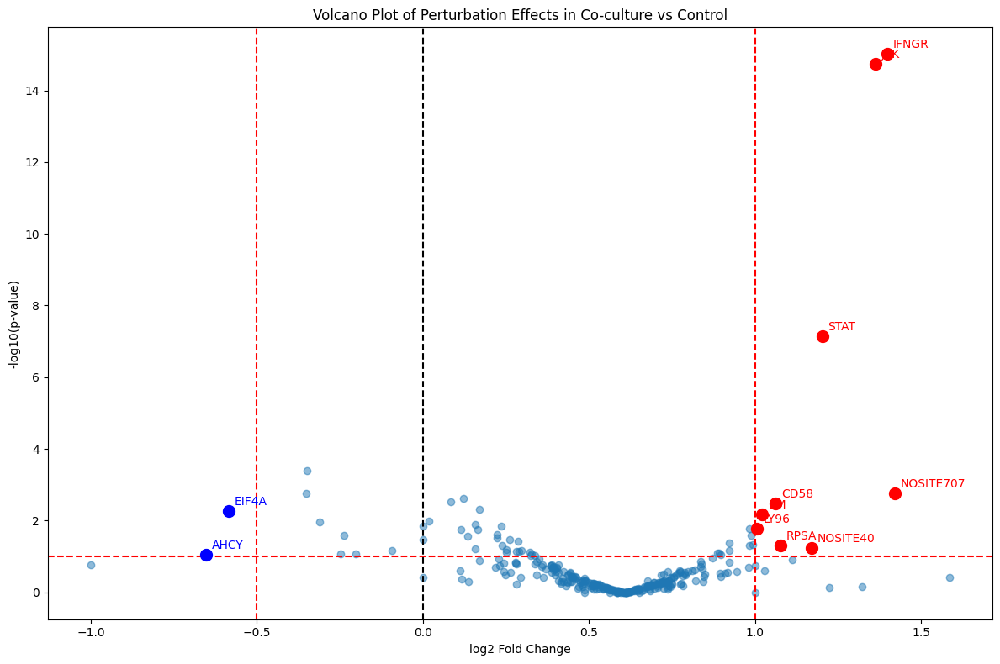


Perturbations increasing cell survival in Co-culture (log2FC > 1):
             log2FC  -log10(p-value)
NOSITE707  1.419539         2.754265
IFNGR      1.397823        15.012551
JAK        1.362299        14.730716
STAT       1.201903         7.145196
NOSITE40   1.169925         1.235870
RPSA       1.076621         1.299545
CD58       1.060696         2.488459
BM         1.021695         2.183114
LY96       1.006370         1.775464

Perturbations reducing cell survival in Co-culture (log2FC < -0.5):
         log2FC  -log10(p-value)
AHCY  -0.652077         1.050391
EIF4A -0.584963         2.266509

Effects of genes in Antigen Presentation pathway:
         log2FC  -log10(p-value)
HLA-C  0.730813         0.285506
HLA-A  0.674600         0.165105
HLA-B  0.483322         0.261310


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the data
adata = sc.read_h5ad('Frangieh_2021.h5ad')

# 1. Calculate cell counts for each perturbation in co-culture and control conditions
def calculate_perturbation_counts(adata, condition):
    return adata[adata.obs['condition'] == condition].obs['perturbation_name'].value_counts()

co_culture_counts = calculate_perturbation_counts(adata, 'Co-culture')
control_counts = calculate_perturbation_counts(adata, 'Control')

# 2. Calculate log2 fold change
perturbations = set(co_culture_counts.index) & set(control_counts.index)
log2fc = pd.Series({gene: np.log2(co_culture_counts[gene] / control_counts[gene])
                    for gene in perturbations})

# 3. Perform statistical test (Fisher's exact test)
def calculate_pvalue(gene):
    co_culture_gene = co_culture_counts[gene]
    co_culture_total = co_culture_counts.sum()
    control_gene = control_counts[gene]
    control_total = control_counts.sum()

    contingency_table = [[co_culture_gene, co_culture_total - co_culture_gene],
                         [control_gene, control_total - control_gene]]

    _, p_value = stats.fisher_exact(contingency_table)
    return p_value

p_values = pd.Series({gene: calculate_pvalue(gene) for gene in perturbations})

# 4. Create a DataFrame with results
results = pd.DataFrame({
    'log2FC': log2fc,
    '-log10(p-value)': -np.log10(p_values)
})

# 5. Identify potential immune evasion and sensitivity genes
significance_threshold = 0.1
fc_threshold_high = 1  # log2FC > 1 means more than 2-fold increase
fc_threshold_low = -0.5  # log2FC < -0.5 means less than 0.71-fold change

potential_evasion_genes = results[
    (results['log2FC'] > fc_threshold_high) &
    (results['-log10(p-value)'] > -np.log10(significance_threshold))
].sort_values('log2FC', ascending=False)

potential_sensitivity_genes = results[
    (results['log2FC'] < fc_threshold_low) &
    (results['-log10(p-value)'] > -np.log10(significance_threshold))
].sort_values('log2FC', ascending=True)

# 6. Create volcano plot
plt.figure(figsize=(12, 8))
plt.scatter(results['log2FC'], results['-log10(p-value)'], alpha=0.5)

# Highlight potential immune evasion genes
for gene in potential_evasion_genes.index:
    plt.annotate(gene, (results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)']),
                 xytext=(5, 5), textcoords='offset points', color='red')
    plt.scatter(results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)'],
                color='red', s=100, zorder=5)

# Highlight potential immune sensitivity genes
for gene in potential_sensitivity_genes.index:
    plt.annotate(gene, (results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)']),
                 xytext=(5, 5), textcoords='offset points', color='blue')
    plt.scatter(results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)'],
                color='blue', s=100, zorder=5)

plt.axhline(y=-np.log10(significance_threshold), color='r', linestyle='--')  # Significance threshold
plt.axvline(x=fc_threshold_high, color='r', linestyle='--')  # Positive fold change threshold
plt.axvline(x=fc_threshold_low, color='r', linestyle='--')  # Negative fold change threshold
plt.axvline(x=0, color='k', linestyle='--')

plt.xlabel('log2 Fold Change')
plt.ylabel('-log10(p-value)')
plt.title('Volcano Plot of Perturbation Effects in Co-culture vs Control')
plt.tight_layout()
plt.show()

# 7. Print potential immune evasion and sensitivity genes
print("\nPerturbations increasing cell survival in Co-culture (log2FC > 1):")
print(potential_evasion_genes)

print("\nPerturbations reducing cell survival in Co-culture (log2FC < -0.5):")
print(potential_sensitivity_genes)

# 8. Compare effects to known pathways
known_pathways = {
    'IFN-γ-JAK/STAT': ['JAK1', 'JAK2', 'STAT1', 'IFNGR1', 'IFNGR2'],
    'Antigen Presentation': ['B2M', 'HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2'],
    'Immune Checkpoints': ['CD274', 'PDCD1LG2', 'CTLA4', 'CD80', 'CD86']
}

for pathway, genes in known_pathways.items():
    pathway_genes = [gene for gene in genes if gene in results.index]
    if pathway_genes:
        print(f"\nEffects of genes in {pathway} pathway:")
        print(results.loc[pathway_genes].sort_values('log2FC', ascending=False))

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


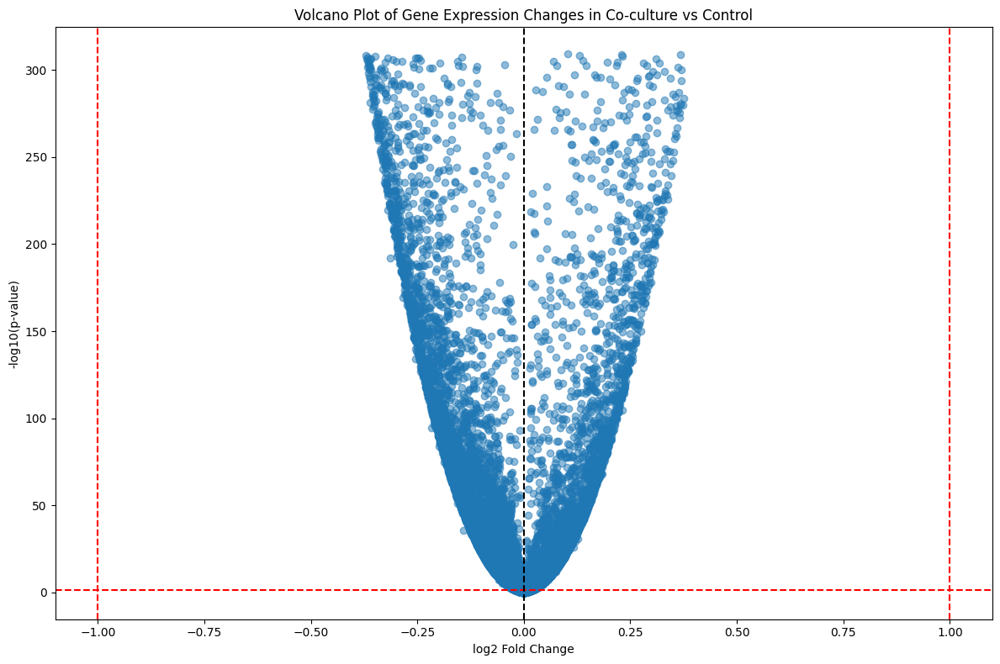

Top potential immune evasion genes:
            log2FC  -log10(p-value)
CD74      2.896447              inf
HLA-DRA   2.634377              inf
HLA-DRB1  2.605072              inf
HLA-DPA1  2.341524              inf
HLA-DMA   1.811564              inf
GBP4      1.736736              inf
GBP2      1.721645              inf
C1S       1.693736              inf
WARS      1.620754              inf
HLA-DPB1  1.548401              inf

Top potential immune sensitivity genes:
          log2FC  -log10(p-value)
LRRC17 -1.240059              inf
PRSS23 -1.228870              inf
IGFBP5 -1.204058              inf
PTHLH  -1.127980              inf
THBS1  -1.041587              inf
FRMD6  -1.008620              inf

Effects of genes in IFN-γ-JAK/STAT pathway:
          log2FC  -log10(p-value)
STAT1   1.019955              inf
IFNGR1  0.208843       168.587546
JAK2   -0.040392         6.339443
IFNGR2 -0.110293        72.141387
JAK1   -0.168793       136.535909

Effects of genes in Antigen Presentatio

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Assuming your AnnData object is named 'adata'

# 1. Calculate average expression for each gene in co-culture and control conditions
def calculate_average_expression(adata, condition):
    subset = adata[adata.obs['condition'] == condition]
    return pd.DataFrame(subset.X.mean(axis=0).T, index=adata.var_names, columns=['mean_expr'])

co_culture_expr = calculate_average_expression(adata, 'Co-culture')
control_expr = calculate_average_expression(adata, 'Control')

# 2. Calculate log2 fold change
log2fc = np.log2((co_culture_expr['mean_expr'] + 1) / (control_expr['mean_expr'] + 1))

# 3. Perform statistical test (t-test)
def calculate_pvalue(gene):
    co_culture_expr = adata[adata.obs['condition'] == 'Co-culture'][:, gene].X.toarray().flatten()
    control_expr = adata[adata.obs['condition'] == 'Control'][:, gene].X.toarray().flatten()
    _, p_value = stats.ttest_ind(co_culture_expr, control_expr)
    return p_value

p_values = pd.Series({gene: calculate_pvalue(gene) for gene in adata.var_names})

# 4. Create a DataFrame with results
results = pd.DataFrame({
    'log2FC': log2fc,
    '-log10(p-value)': -np.log10(p_values)
})

# 5. Identify potential immune evasion and sensitivity genes
significance_threshold = 0.05
fc_threshold = 1  # log2FC > 1 or < -1 means more than 2-fold change

potential_evasion_genes = results[
    (results['log2FC'] > fc_threshold) &
    (results['-log10(p-value)'] > -np.log10(significance_threshold))
].sort_values('log2FC', ascending=False)

potential_sensitivity_genes = results[
    (results['log2FC'] < -fc_threshold) &
    (results['-log10(p-value)'] > -np.log10(significance_threshold))
].sort_values('log2FC', ascending=True)

# 6. Create volcano plot
plt.figure(figsize=(12, 8))
plt.scatter(results['log2FC'], results['-log10(p-value)'], alpha=0.5)

# Highlight top potential immune evasion and sensitivity genes
for gene in potential_evasion_genes.index[:10]:
    plt.annotate(gene, (results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)']),
                 xytext=(5, 5), textcoords='offset points', color='red')
    plt.scatter(results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)'],
                color='red', s=100, zorder=5)

for gene in potential_sensitivity_genes.index[:10]:
    plt.annotate(gene, (results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)']),
                 xytext=(5, 5), textcoords='offset points', color='blue')
    plt.scatter(results.loc[gene, 'log2FC'], results.loc[gene, '-log10(p-value)'],
                color='blue', s=100, zorder=5)

plt.axhline(y=-np.log10(significance_threshold), color='r', linestyle='--')  # Significance threshold
plt.axvline(x=fc_threshold, color='r', linestyle='--')  # Positive fold change threshold
plt.axvline(x=-fc_threshold, color='r', linestyle='--')  # Negative fold change threshold
plt.axvline(x=0, color='k', linestyle='--')

plt.xlabel('log2 Fold Change')
plt.ylabel('-log10(p-value)')
plt.title('Volcano Plot of Gene Expression Changes in Co-culture vs Control')
plt.tight_layout()
plt.show()

# 7. Print top potential immune evasion and sensitivity genes
print("Top potential immune evasion genes:")
print(potential_evasion_genes.head(10))

print("\nTop potential immune sensitivity genes:")
print(potential_sensitivity_genes.head(10))

# 8. Compare effects to known pathways
known_pathways = {
    'IFN-γ-JAK/STAT': ['JAK1', 'JAK2', 'STAT1', 'IFNGR1', 'IFNGR2'],
    'Antigen Presentation': ['B2M', 'HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2'],
    'Immune Checkpoints': ['CD274', 'PDCD1LG2', 'CTLA4', 'CD80', 'CD86']
}

for pathway, genes in known_pathways.items():
    pathway_genes = [gene for gene in genes if gene in results.index]
    if pathway_genes:
        print(f"\nEffects of genes in {pathway} pathway:")
        print(results.loc[pathway_genes].sort_values('log2FC', ascending=False))

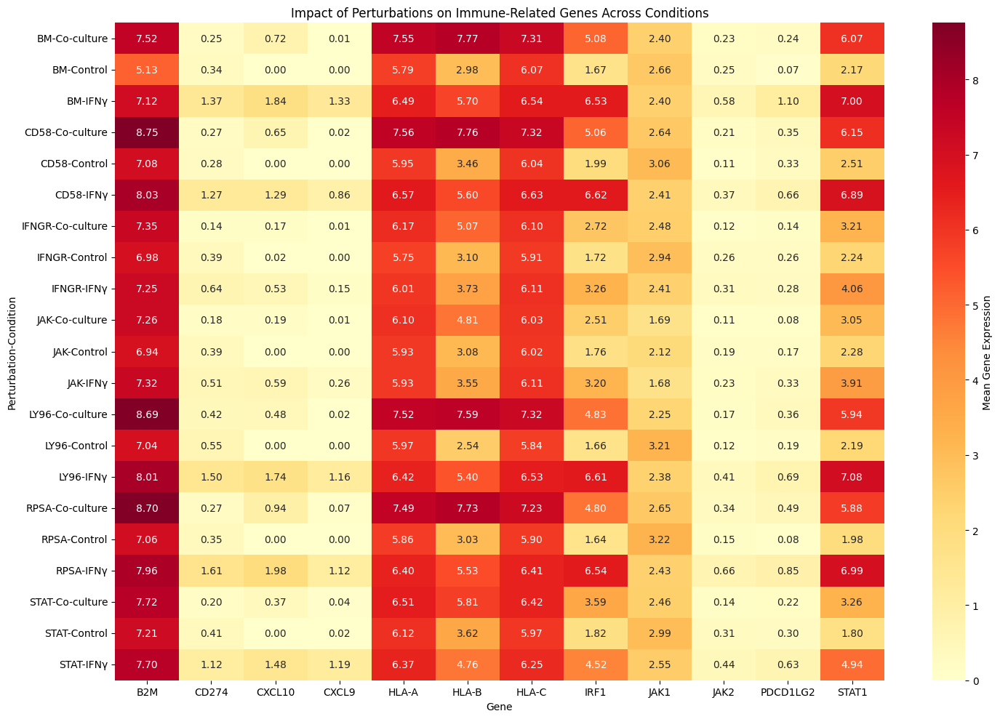

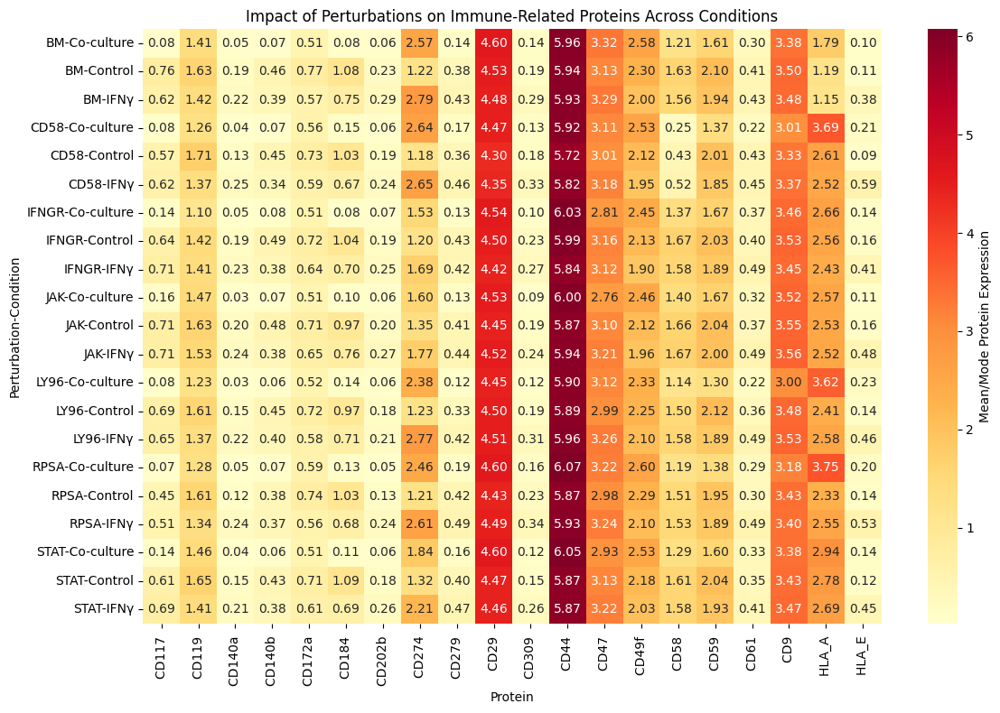

Gene Expression Summary:
Condition     Co-culture   Control      IFNγ
Perturbation                                
BM              3.763776  2.260267  4.000147
CD58            3.895872  2.566509  3.931414
IFNGR           2.807071  2.463135  2.896238
JAK             2.667857  2.406516  2.804676
LY96            3.799010  2.442538  3.995620
RPSA            3.882248  2.438791  4.039202
STAT            3.062474  2.548482  3.496508

Protein Expression Summary:
Condition     Co-culture   Control      IFNγ
Perturbation                                
BM              1.497673  1.587628  1.620293
CD58            1.498395  1.529559  1.604992
IFNGR           1.465254  1.634500  1.611745
JAK             1.478935  1.633947  1.667150
LY96            1.502286  1.609507  1.699663
RPSA            1.575388  1.577674  1.676652
STAT            1.514690  1.633714  1.663783


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

adata = sc.read_h5ad('Frangieh_2021.h5ad')
# 3. Function to calculate mean expression for a gene across perturbations and conditions
top_perturbations = ['IFNGR', 'JAK', 'STAT', 'CD58', 'BM', 'RPSA', 'LY96']
immune_genes = [
    'HLA-A', 'HLA-B', 'HLA-C', 'B2M',  # Antigen presentation
    'STAT1', 'IRF1', 'JAK1', 'JAK2',   # IFN-γ response
    'CD274', 'PDCD1LG2',               # Immune checkpoints
    'CXCL10', 'CXCL9',                 # Chemokines
]
immune_proteins = []
for i in list(adata.uns['protein_names']):
  protein_name = i.split('protein')[0]
  immune_proteins.append(protein_name)

def mean_expression(adata, gene, perturbation, condition):
    mask = (adata.obs['perturbation_name'] == perturbation) & (adata.obs['condition'] == condition)
    return adata[mask, gene].X.mean()

# 4. Create a dataframe with mean expression values for genes
results = []
for perturbation in top_perturbations:
    for gene in immune_genes:
        for condition in ['Control', 'IFNγ', 'Co-culture']:
            mean_expr = mean_expression(adata, gene, perturbation, condition)
            results.append({
                'Perturbation': perturbation,
                'Gene': gene,
                'Condition': condition,
                'Mean Expression': mean_expr
            })

df_results = pd.DataFrame(results)

# 5. Create heatmap for gene expression
plt.figure(figsize=(15, 10))
pivot_df = df_results.pivot_table(values='Mean Expression',
                                  index=['Perturbation', 'Condition'],
                                  columns='Gene')
sns.heatmap(pivot_df, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Mean Gene Expression'})
plt.title('Impact of Perturbations on Immune-Related Genes Across Conditions')
plt.tight_layout()
plt.show()

# 6. Protein expression analysis
protein_results = []
for perturbation in top_perturbations:
    for protein in immune_proteins:
        for condition in ['Control', 'IFNγ', 'Co-culture']:
            mask = (adata.obs['perturbation_name'] == perturbation) & (adata.obs['condition'] == condition)
            protein_index = np.where(adata.uns['protein_names'] == (protein+ 'protein'))[0][0]

            # Get the protein expression data for this subset
            protein_data = adata[mask].obsm['protein_expression'][:, protein_index]

            # Convert string data to numeric if possible
            try:
                numeric_data = pd.to_numeric(protein_data)
                mean_protein_expr = np.mean(numeric_data)
            except ValueError:
                # If conversion fails, we'll use the most common value
                mean_protein_expr = pd.Series(protein_data).mode().iloc[0]
                print(f"Warning: Non-numeric data for {protein} in {perturbation}, {condition}. Using mode.")

            protein_results.append({
                'Perturbation': perturbation,
                'Protein': protein,
                'Condition': condition,
                'Mean Expression': mean_protein_expr
            })

df_protein_results = pd.DataFrame(protein_results)

# Create heatmap for protein expression
plt.figure(figsize=(12, 8))
pivot_protein_df = df_protein_results.pivot_table(values='Mean Expression',
                                                  index=['Perturbation', 'Condition'],
                                                  columns='Protein')
sns.heatmap(pivot_protein_df, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Mean/Mode Protein Expression'})
plt.title('Impact of Perturbations on Immune-Related Proteins Across Conditions')
plt.tight_layout()
plt.show()

# 7. Print summary statistics
print("Gene Expression Summary:")
print(df_results.groupby(['Perturbation', 'Condition'])['Mean Expression'].mean().unstack())
print("\nProtein Expression Summary:")
print(df_protein_results.groupby(['Perturbation', 'Condition'])['Mean Expression'].mean().unstack())

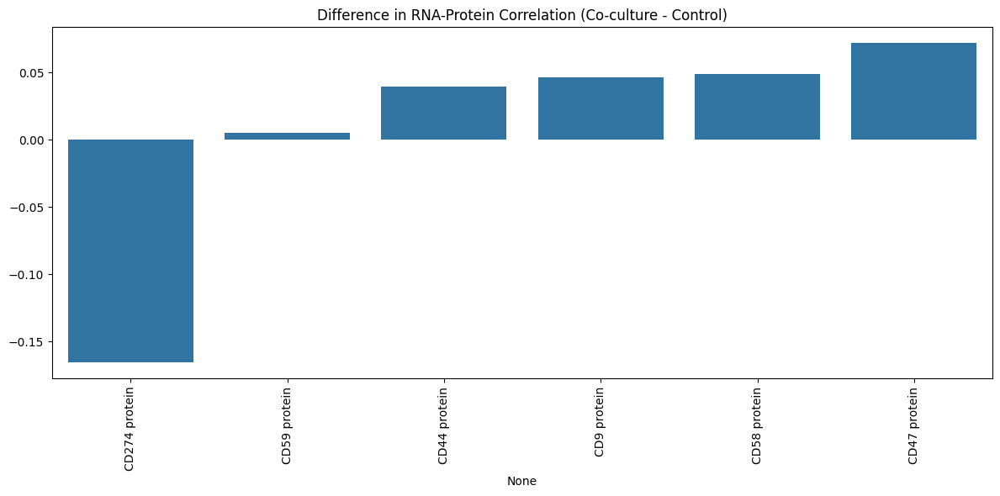

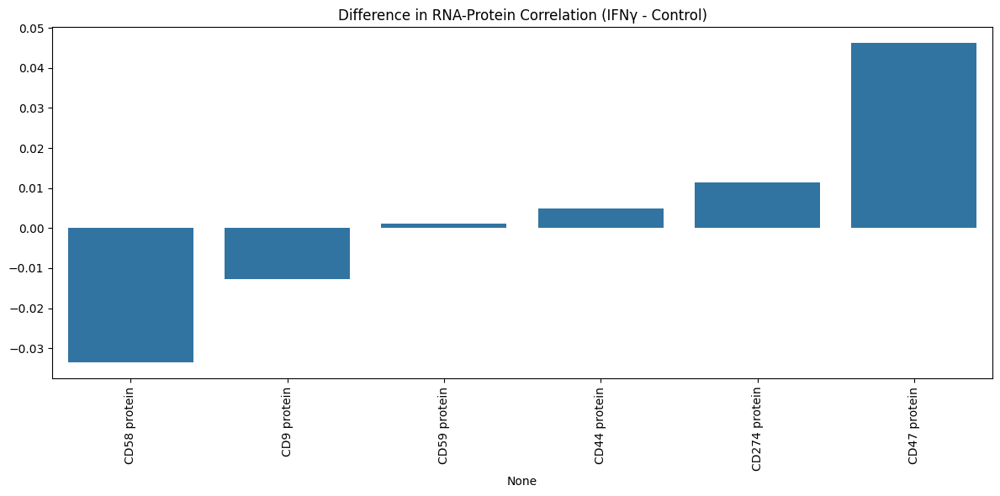

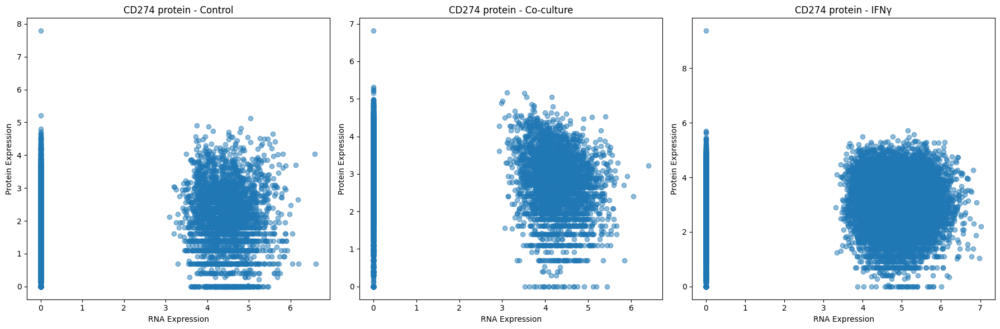

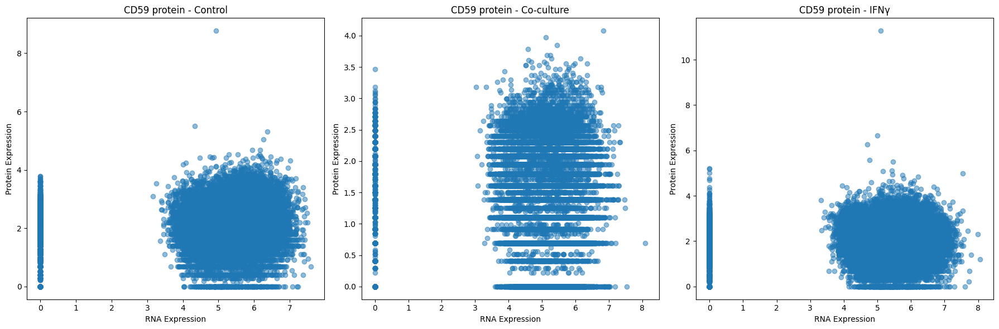

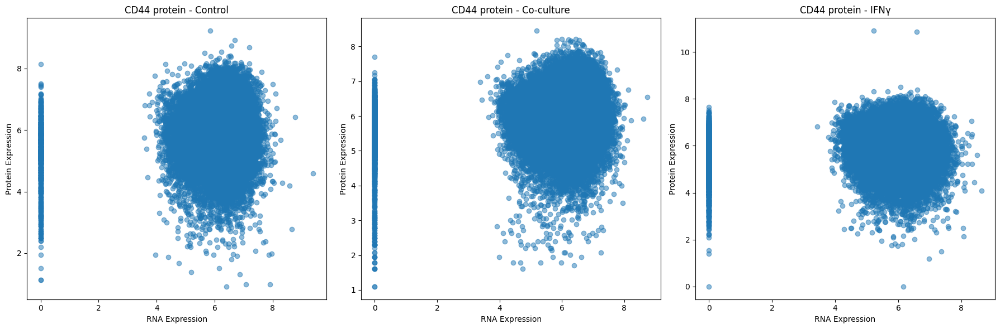

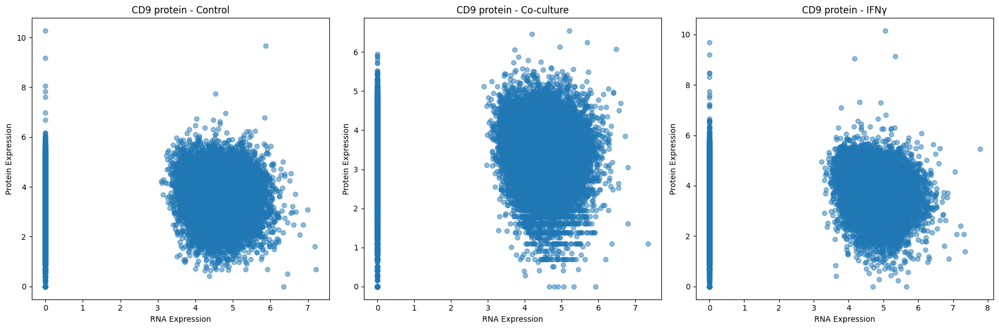

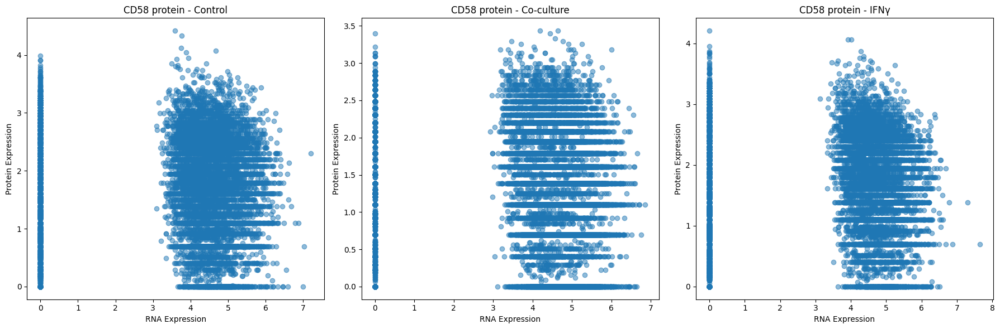

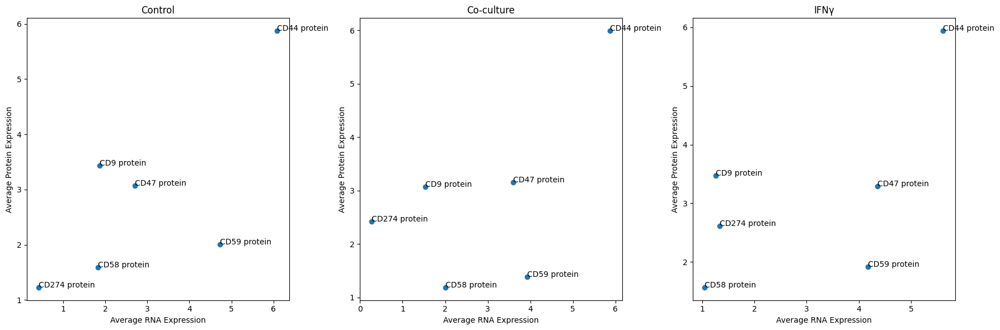

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
adata = sc.read_h5ad('Frangieh_2021.h5ad')

# Convert protein expression from string to float
adata.obsm['protein_expression'] = adata.obsm['protein_expression'].astype(float)

# Get protein names and create a mapping to RNA names
protein_names = adata.uns['protein_names']
rna_names = np.array([name.replace(' protein', '') for name in protein_names])

# Find the intersection of protein names and var names
valid_genes = np.array([gene for gene in rna_names if gene in adata.var_names])

# Function to calculate RNA-protein correlation
def calculate_correlation(adata, condition):
    condition_mask = adata.obs['condition'] == condition
    rna_expr = adata[condition_mask, valid_genes].X.toarray()
    protein_indices = np.array([np.where(rna_names == gene)[0][0] for gene in valid_genes])
    protein_expr = adata[condition_mask].obsm['protein_expression'][:, protein_indices]

    correlations = []
    for i in range(len(valid_genes)):
        corr = np.corrcoef(rna_expr[:, i], protein_expr[:, i])[0, 1]
        correlations.append(corr)

    return pd.Series(correlations, index=protein_names[protein_indices])

# Calculate correlations for each condition
control_corr = calculate_correlation(adata, 'Control')
coculture_corr = calculate_correlation(adata, 'Co-culture')
ifng_corr = calculate_correlation(adata, 'IFNγ')

# Identify genes with discrepancies between RNA and protein levels
discrepancy_genes = (coculture_corr - control_corr).sort_values()
discrepancy_genes_ = (ifng_corr - control_corr).sort_values()

# Plot correlation differences
plt.figure(figsize=(12, 6))
sns.barplot(x=discrepancy_genes.index, y=discrepancy_genes.values)
plt.title('Difference in RNA-Protein Correlation (Co-culture - Control)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()
# Plot correlation differences
plt.figure(figsize=(12, 6))
sns.barplot(x=discrepancy_genes_.index, y=discrepancy_genes_.values)
plt.title('Difference in RNA-Protein Correlation (IFNγ - Control)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()
# Function to plot RNA vs Protein levels for a specific gene
def plot_rna_vs_protein(adata, gene):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    conditions = ['Control', 'Co-culture', 'IFNγ']

    rna_gene = gene.replace(' protein', '')
    protein_index = np.where(protein_names == gene)[0][0]

    for ax, condition in zip(axes, conditions):
        condition_mask = adata.obs['condition'] == condition
        rna_expr = adata[condition_mask, rna_gene].X.toarray().flatten()
        protein_expr = adata[condition_mask].obsm['protein_expression'][:, protein_index]

        ax.scatter(rna_expr, protein_expr, alpha=0.5)
        ax.set_xlabel('RNA Expression')
        ax.set_ylabel('Protein Expression')
        ax.set_title(f'{gene} - {condition}')

    plt.tight_layout()
    plt.show()

# Plot RNA vs Protein for top discrepancy genes
for gene in discrepancy_genes.index[:5]:
    plot_rna_vs_protein(adata, gene)

# Calculate average expression levels
def calculate_avg_expression(adata, condition):
    condition_mask = adata.obs['condition'] == condition
    rna_expr = np.mean(adata[condition_mask, valid_genes].X.toarray(), axis=0)
    protein_indices = np.array([np.where(rna_names == gene)[0][0] for gene in valid_genes])
    protein_expr = np.mean(adata[condition_mask].obsm['protein_expression'][:, protein_indices], axis=0)
    return pd.DataFrame({'RNA': rna_expr, 'Protein': protein_expr}, index=protein_names[protein_indices])

control_avg = calculate_avg_expression(adata, 'Control')
coculture_avg = calculate_avg_expression(adata, 'Co-culture')
ifng_avg = calculate_avg_expression(adata, 'IFNγ')

# Plot average expression levels
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
conditions = ['Control', 'Co-culture', 'IFNγ']
avg_expressions = [control_avg, coculture_avg, ifng_avg]

for ax, condition, avg_expr in zip(axes, conditions, avg_expressions):
    ax.scatter(avg_expr['RNA'], avg_expr['Protein'])
    for i, gene in enumerate(avg_expr.index):
        ax.annotate(gene, (avg_expr['RNA'][i], avg_expr['Protein'][i]))
    ax.set_xlabel('Average RNA Expression')
    ax.set_ylabel('Average Protein Expression')
    ax.set_title(f'{condition}')

plt.tight_layout()
plt.show()

<ipython-input-8-1d7dcfd5bf30>:62: RuntimeWarning: divide by zero encountered in log10
  return -np.log10(p_values)


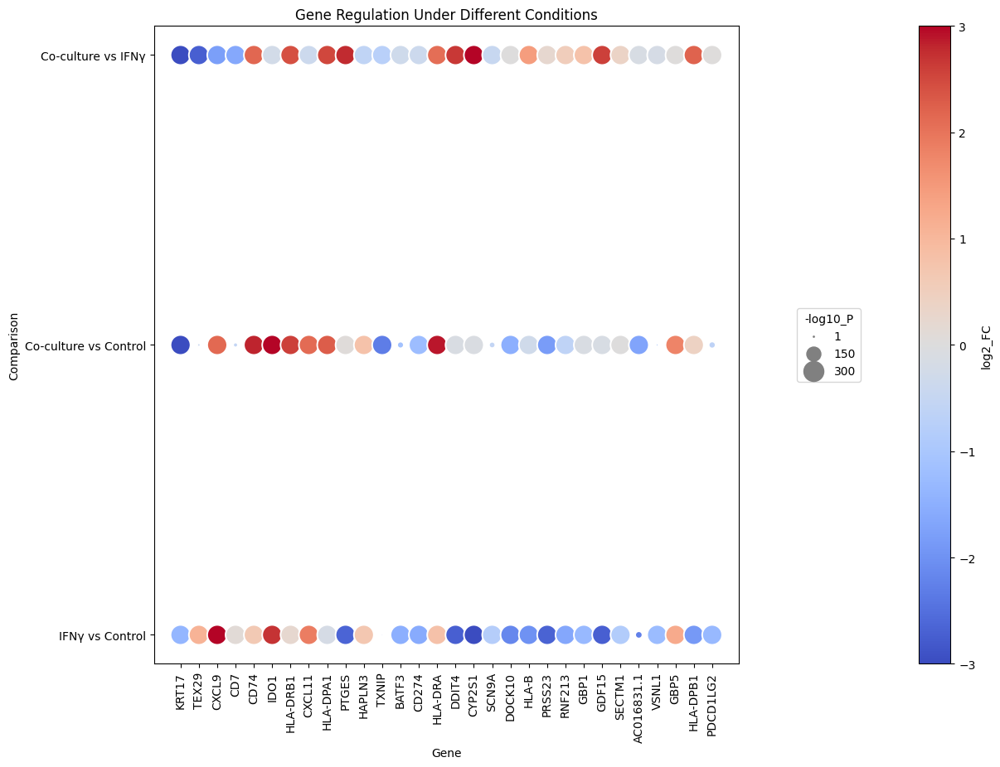

In [ ]:
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from scipy import sparse

# Load the AnnData object
adata = sc.read_h5ad('Frangieh_2021.h5ad')

# List of key immune genes (from user's list)
immune_genes = [
    'KRT17', 'TEX29', 'CXCL9', 'CD7', 'CD74', 'IDO1', 'HLA-DRB1', 'CXCL11',
    'HLA-DPA1', 'PTGES', 'HAPLN3', 'TXNIP', 'BATF3', "CD274",'HLA-DRA', 'DDIT4',
     'CYP2S1', 'SCN9A', 'DOCK10', 'HLA-B', 'PRSS23', 'RNF213',
    'GBP1', 'GDF15', 'SECTM1', 'AC016831.1', 'VSNL1', 'GBP5', 'HLA-DPB1',
    'PDCD1LG2'
]
# Filter the AnnData object to keep only the key immune genes
adata = adata[:, adata.var_names.isin(immune_genes)]

# Ensure the gene names are in the correct order
gene_names = adata.var_names

# Define conditions for comparison
conditions = ['Co-culture', 'IFNγ', 'Control']

# Extract gene expression data for the conditions
def extract_gene_expression(adata, condition):
    data = adata[adata.obs['condition'] == condition].X
    if sparse.issparse(data):
        data = data.toarray()
    return data

co_culture = extract_gene_expression(adata, 'Co-culture')
ifn_gamma = extract_gene_expression(adata, 'IFNγ')
control = extract_gene_expression(adata, 'Control')

# Calculate log2 fold changes and p-values using Welch's t-test
def calculate_fold_change_and_p_values(group1, group2):
    small_constant = 1e-9  # Add a small constant to avoid division by zero
    mean_group1 = np.mean(group1, axis=0) + small_constant
    mean_group2 = np.mean(group2, axis=0) + small_constant

    log2_fc = np.log2(mean_group1 / mean_group2)
    _, p_values = ttest_ind(group1, group2, axis=0, equal_var=False)  # Welch's t-test

    return log2_fc, p_values

log2_fc_co_vs_ifn, p_values_co_vs_ifn = calculate_fold_change_and_p_values(co_culture, ifn_gamma)
log2_fc_co_vs_ctrl, p_values_co_vs_ctrl = calculate_fold_change_and_p_values(co_culture, control)
log2_fc_ifn_vs_ctrl, p_values_ifn_vs_ctrl = calculate_fold_change_and_p_values(ifn_gamma, control)

# Replace zero p-values with a very small number to avoid log10 issues
p_values_co_vs_ifn[p_values_co_vs_ifn == 0] = 1e-300
p_values_co_vs_ctrl[p_values_co_vs_ctrl == 0] = 1e-300
p_values_ifn_vs_ctrl[p_values_ifn_vs_ctrl == 0] = 1e-300

# Normalize -log10(P) for each group separately
def normalize_p_values(p_values):
    return -np.log10(p_values)

# Create separate dataframes for each comparison and normalize p-values
df_co_vs_ifn = pd.DataFrame({
    'Gene': gene_names,
    'Comparison': 'Co-culture vs IFNγ',
    'log2_FC': log2_fc_co_vs_ifn,
    '-log10_P': normalize_p_values(p_values_co_vs_ifn)
})

df_co_vs_ctrl = pd.DataFrame({
    'Gene': gene_names,
    'Comparison': 'Co-culture vs Control',
    'log2_FC': log2_fc_co_vs_ctrl,
    '-log10_P': normalize_p_values(p_values_co_vs_ctrl)
})

df_ifn_vs_ctrl = pd.DataFrame({
    'Gene': gene_names,
    'Comparison': 'IFNγ vs Control',
    'log2_FC': log2_fc_ifn_vs_ctrl,
    '-log10_P': normalize_p_values(p_values_ifn_vs_ctrl)
})

# Normalize log2_FC values to the range -3 to 3
def normalize_log2_fc(log2_fc):
    min_val = log2_fc.min()
    max_val = log2_fc.max()
    return 6 * (log2_fc - min_val) / (max_val - min_val) - 3

df_co_vs_ifn['log2_FC'] = normalize_log2_fc(df_co_vs_ifn['log2_FC'])
df_co_vs_ctrl['log2_FC'] = normalize_log2_fc(df_co_vs_ctrl['log2_FC'])
df_ifn_vs_ctrl['log2_FC'] = normalize_log2_fc(df_ifn_vs_ctrl['log2_FC'])

# Combine dataframes
df = pd.concat([df_co_vs_ifn, df_co_vs_ctrl, df_ifn_vs_ctrl])

# Replace inf values with maximum finite values within the desired ranges
df['-log10_P'].replace(np.inf, 300, inplace=True)

# Ensure the order of genes in the plot matches the initial list
df['Gene'] = pd.Categorical(df['Gene'], categories=immune_genes, ordered=True)
df = df.sort_values('Gene')

# Identify significant genes for highlighting
significance_threshold = 1.3  # Example threshold for significance
df['significant'] = df['-log10_P'] > significance_threshold

# Log the values
# print(df[['Gene', 'Comparison', 'log2_FC', '-log10_P']])

# Create the plot
plt.figure(figsize=(14, 10))
scatter = sns.scatterplot(
    data=df,
    x='Gene', y='Comparison', size='-log10_P', hue='log2_FC',
    sizes=(1, 300), palette='coolwarm', hue_norm=(-3, 3)
)

# Custom legend for log2_FC
norm = plt.Normalize(-3, 3)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=scatter, orientation='vertical', pad=0.2)
cbar.set_label('log2_FC')

# Custom legend for -log10_P
legend_sizes = [1, 150, 300]
for size in legend_sizes:
    plt.scatter([], [], s=size, color='gray', label=f'{size}')

# Adjust legend position and remove unwanted legend elements
handles, labels = scatter.get_legend_handles_labels()
size_legend_handles = handles[-len(legend_sizes):]
size_legend_labels = labels[-len(legend_sizes):]

# Adjusting the position of the size legend
plt.legend(size_legend_handles, size_legend_labels, title='-log10_P', bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., scatterpoints=1, frameon=True)

# Customize other plot features
plt.xticks(rotation=90)
plt.title('Gene Regulation Under Different Conditions')

# Display the plot
plt.show()


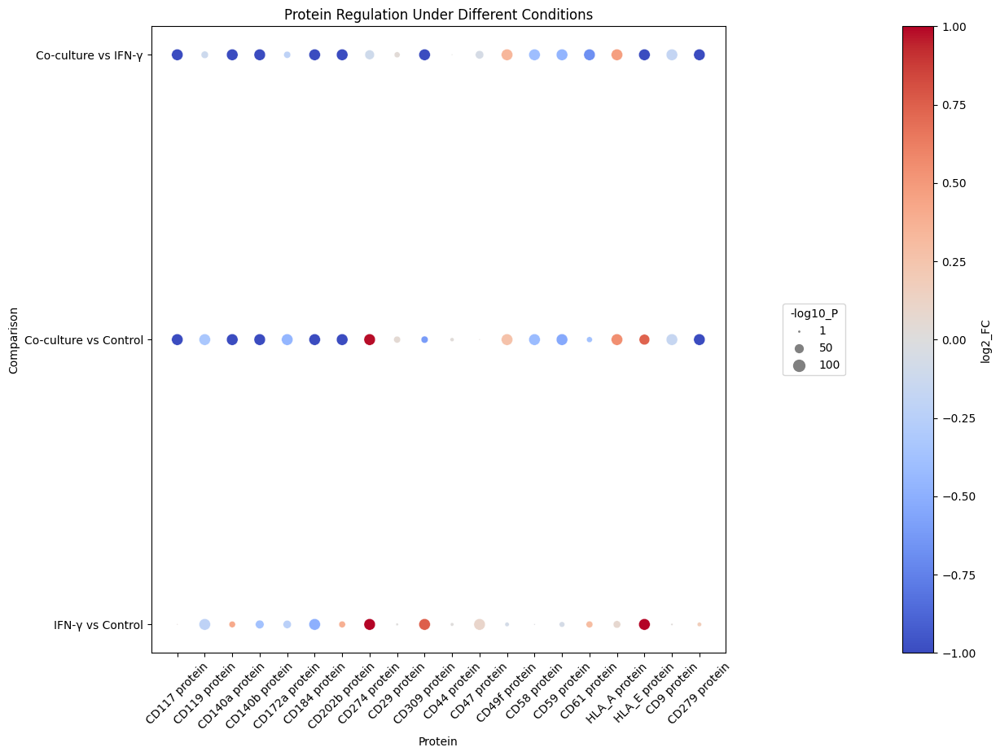

In [ ]:




import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import scanpy as sc

# Load the AnnData object
adata = sc.read_h5ad('Frangieh_2021.h5ad')


# Convert protein_expression to float
adata.obsm['protein_expression'] = adata.obsm['protein_expression'].astype(float)

# Ensure the protein names are in the correct order
protein_names = adata.uns['protein_names']

# Define conditions for comparison
conditions = ['Co-culture', 'IFN-γ', 'Control']

# Extract protein expression data for the conditions
co_culture = adata[adata.obs['condition'] == 'Co-culture'].obsm['protein_expression']
ifn_gamma = adata[adata.obs['condition'] == 'IFNγ'].obsm['protein_expression']
control = adata[adata.obs['condition'] == 'Control'].obsm['protein_expression']

# Calculate log2 fold changes and p-values using t-test
def calculate_fold_change_and_p_values(group1, group2):
    log2_fc = np.log2(np.mean(group1, axis=0) / np.mean(group2, axis=0))
    p_values = np.array([ttest_ind(group1[:, i], group2[:, i])[1] for i in range(group1.shape[1])])
    return log2_fc, p_values

log2_fc_co_vs_ifn, p_values_co_vs_ifn = calculate_fold_change_and_p_values(co_culture, ifn_gamma)
log2_fc_co_vs_ctrl, p_values_co_vs_ctrl = calculate_fold_change_and_p_values(co_culture, control)
log2_fc_ifn_vs_ctrl, p_values_ifn_vs_ctrl = calculate_fold_change_and_p_values(ifn_gamma, control)

# Replace zero p-values with a very small number to avoid log10 issues
p_values_co_vs_ifn[p_values_co_vs_ifn == 0] = 1e-300
p_values_co_vs_ctrl[p_values_co_vs_ctrl == 0] = 1e-300
p_values_ifn_vs_ctrl[p_values_ifn_vs_ctrl == 0] = 1e-300

# Normalize -log10(P) for each group separately
def normalize_p_values(p_values):
    return -np.log10(p_values)

# Create separate dataframes for each comparison and normalize p-values
df_co_vs_ifn = pd.DataFrame({
    'Protein': protein_names,
    'Comparison': 'Co-culture vs IFN-γ',
    'log2_FC': log2_fc_co_vs_ifn,
    '-log10_P': normalize_p_values(p_values_co_vs_ifn)
})
df_co_vs_ifn['-log10_P_normalized'] = (df_co_vs_ifn['-log10_P'] - df_co_vs_ifn['-log10_P'].min()) / (df_co_vs_ifn['-log10_P'].max() - df_co_vs_ifn['-log10_P'].min()) * 99 + 1

df_co_vs_ctrl = pd.DataFrame({
    'Protein': protein_names,
    'Comparison': 'Co-culture vs Control',
    'log2_FC': log2_fc_co_vs_ctrl,
    '-log10_P': normalize_p_values(p_values_co_vs_ctrl)
})
df_co_vs_ctrl['-log10_P_normalized'] = (df_co_vs_ctrl['-log10_P'] - df_co_vs_ctrl['-log10_P'].min()) / (df_co_vs_ctrl['-log10_P'].max() - df_co_vs_ctrl['-log10_P'].min()) * 99 + 1

df_ifn_vs_ctrl = pd.DataFrame({
    'Protein': protein_names,
    'Comparison': 'IFN-γ vs Control',
    'log2_FC': log2_fc_ifn_vs_ctrl,
    '-log10_P': normalize_p_values(p_values_ifn_vs_ctrl)
})
df_ifn_vs_ctrl['-log10_P_normalized'] = (df_ifn_vs_ctrl['-log10_P'] - df_ifn_vs_ctrl['-log10_P'].min()) / (df_ifn_vs_ctrl['-log10_P'].max() - df_ifn_vs_ctrl['-log10_P'].min()) * 99 + 1

# Combine dataframes
df = pd.concat([df_co_vs_ifn, df_co_vs_ctrl, df_ifn_vs_ctrl])


# Identify significant proteins for highlighting
significance_threshold = 1.3  # Example threshold for significance
df['significant'] = df['-log10_P'] > significance_threshold

# Set edge color based on significance
# df['edgecolor'] = df['significant'].map({True: 'black', False: 'none'})

# Create the plot
plt.figure(figsize=(14, 10))
scatter = sns.scatterplot(
    data=df,
    x='Protein', y='Comparison', size='-log10_P_normalized', hue='log2_FC',
    sizes=(1, 100), palette='coolwarm', hue_norm=(-1, 1)
)

# Custom legend for log2_FC
norm = plt.Normalize(-1, 1)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=scatter, orientation='vertical', pad=0.2)
cbar.set_label('log2_FC')

# Custom legend for -log10_P
legend_sizes = [1, 50, 100]
for size in legend_sizes:
    plt.scatter([], [], s=size, color='gray', label=f'{size}')

# Adjust legend position and remove unwanted legend elements
handles, labels = scatter.get_legend_handles_labels()
size_legend_handles = handles[-len(legend_sizes):]
size_legend_labels = labels[-len(legend_sizes):]

# Adjusting the position of the size legend
plt.legend(size_legend_handles, size_legend_labels, title='-log10_P', bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., scatterpoints=1, frameon=True)

# Customize other plot features
plt.xticks(rotation=45)
plt.title('Protein Regulation Under Different Conditions')

# Display the plot
plt.show()

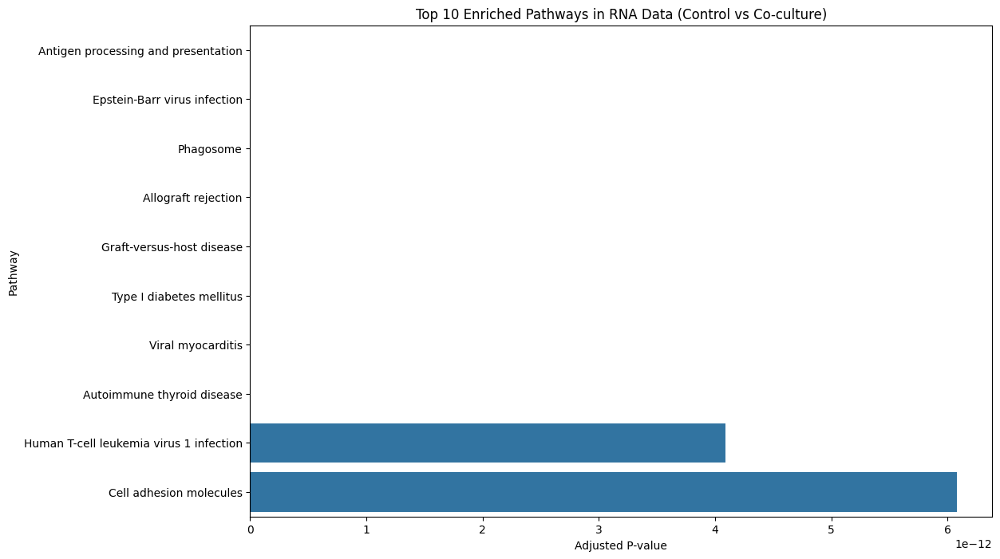

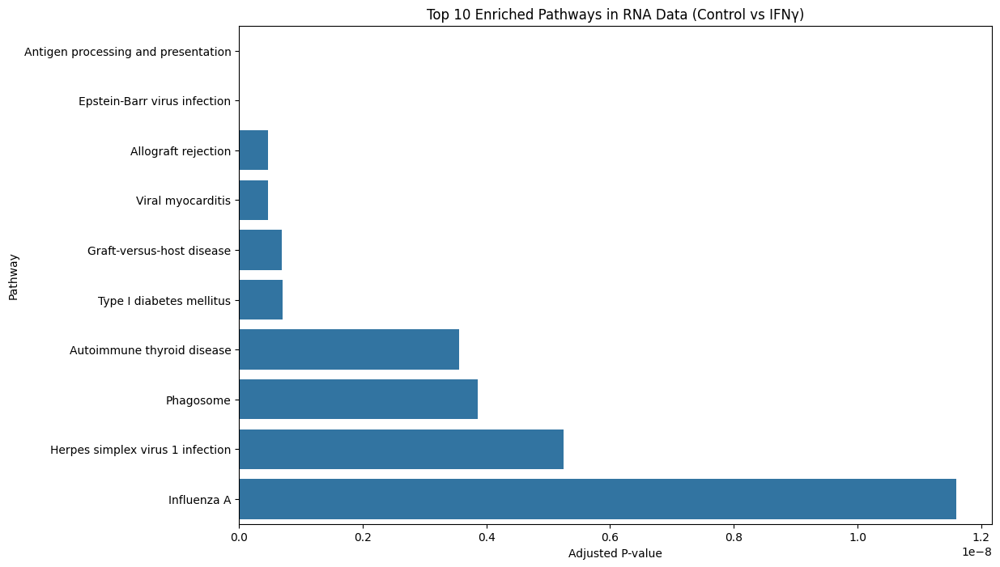

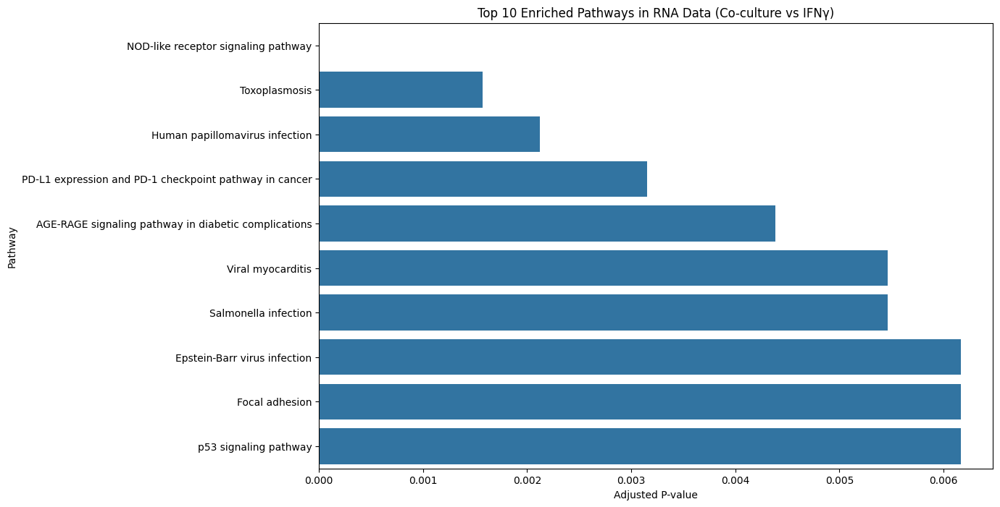

Protein data and names dimensions match.


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gseapy as gp
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# Helper function to perform differential expression analysis
def perform_DE_analysis(adata, group1, group2):
    adata_sub = adata[adata.obs['condition'].isin([group1, group2])].copy()
    sc.tl.rank_genes_groups(adata_sub, 'condition', groups=[group2], reference=group1, method='t-test')
    return adata_sub

# Pairwise comparisons
comparisons = [('Control', 'Co-culture'), ('Control', 'IFNγ'), ('Co-culture', 'IFNγ')]

for group1, group2 in comparisons:
    adata_sub = perform_DE_analysis(adata, group1, group2)

    # Extract top 100 DEGs
    degs = pd.DataFrame(adata_sub.uns['rank_genes_groups']['names']).head(100)
    degs.to_csv(f'differentially_expressed_genes_{group1}_vs_{group2}.csv', index=False)

    # Perform pathway enrichment analysis using gseapy on RNA DEGs
    rna_enr = gp.enrichr(gene_list=degs.iloc[:, 0].tolist(),  # List of DEGs
                         gene_sets='KEGG_2021_Human',   # You can choose other gene sets too
                         organism='Human',
                         outdir=f'enrichr_results_rna_{group1}_vs_{group2}')

    # Check if there are enriched terms
    if rna_enr.results.shape[0] > 0:
        # Sort and select top 10 enriched pathways
        rna_enrichment_results = rna_enr.results.sort_values('Adjusted P-value').head(10)

        # Bar plot for RNA pathway enrichment
        plt.figure(figsize=(12, 8))
        sns.barplot(x='Adjusted P-value', y='Term', data=rna_enrichment_results)
        plt.title(f'Top 10 Enriched Pathways in RNA Data ({group1} vs {group2})')
        plt.xlabel('Adjusted P-value')
        plt.ylabel('Pathway')
        plt.show()
    else:
        print(f"No enriched terms found for RNA data in {group1} vs {group2} comparison.")

# If you have protein expression data in 'protein_expression'
protein_data = adata.obsm['protein_expression']

# Ensure protein_names and protein_data have matching dimensions
protein_names = adata.uns['protein_names']
if isinstance(protein_data, np.ndarray) and protein_data.shape[1] == len(protein_names):
    print("Protein data and names dimensions match.")
else:
    raise ValueError("Protein data shape does not match the number of protein names")

# Ensure protein_data is numeric
protein_data = protein_data.astype(float)

# Define the function to get protein DEGs
def some_protein_analysis_function(protein_data, adata, group1, group2):
    # Normalize protein expression data
    protein_data = protein_data / np.sum(protein_data, axis=1, keepdims=True) * 1e4

    # Identify perturbed and control cells
    cells_group1 = adata.obs['condition'] == group1
    cells_group2 = adata.obs['condition'] == group2

    # Initialize lists to store results
    proteins = []
    p_values = []
    fold_changes = []

    # Perform statistical testing for each protein
    for i, protein in enumerate(adata.uns['protein_names']):
        expression_group1 = protein_data[cells_group1, i]
        expression_group2 = protein_data[cells_group2, i]

        # Perform t-test
        t_stat, p_val = ttest_ind(expression_group1, expression_group2)

        # Calculate fold change
        mean_group1 = np.mean(expression_group1)
        mean_group2 = np.mean(expression_group2)
        fold_change = mean_group2 / mean_group1 if mean_group1 != 0 else np.inf

        # Store results
        proteins.append(protein)
        p_values.append(p_val)
        fold_changes.append(fold_change)

    # Correct for multiple testing
    adjusted_p_values = multipletests(p_values, method='fdr_bh')[1]

    # Compile results into a DataFrame
    results_df = pd.DataFrame({
        'protein': proteins,
        'p_value': p_values,
        'adjusted_p_value': adjusted_p_values,
        'fold_change': fold_changes
    })

    # Filter for significant proteins
    significant_proteins = results_df[(results_df['adjusted_p_value'] < 0.05) & (np.abs(results_df['fold_change']) > 2)]

    return significant_proteins


